# Flight Rate Prediction

### Problem Statement

Flight ticket prices can be something hard to guess, today we might see a price, check out the price of the same flight tomorrow, it will be a different story. We might have often heard travellers saying that flight ticket prices are so unpredictable. Here you will be provided with prices of flight tickets for various airlines between the months of March and June of 2019 and between various cities.
Size of training set: 10683 records
Size of test set: 2671 records


##### Features

Airline: The name of the airline.>>>
Date_of_Journey: The date of the journey>>>
Source: The source from which the service begins.>>>
Destination: The destination where the service ends.>>>
Route: The route taken by the flight to reach the destination.>>>
Dep_Time: The time when the journey starts from the source.>>>
Arrival_Time: Time of arrival at the destination.>>>
Duration: Total duration of the flight.>>>
Total_Stops: Total stops between the source and destination.>>>
Additional_Info: Additional information about the flight.>>>
Price: The price of the ticket.>>>


## Importing Libraries

In [162]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stat
from scipy.stats import zscore
from sklearn.linear_model import LinearRegression
from sklearn.naive_bayes import MultinomialNB,GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from sklearn.ensemble import AdaBoostClassifier
from sklearn.preprocessing import LabelEncoder
import xgboost
from xgboost import XGBRegressor
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve,roc_auc_score
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
import joblib
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', None) # to see all the rows
pd.set_option('display.max_columns', None) # to see all the columns

## Importing and Exploring Dataset

In [163]:
Flight_Train=pd.read_csv('Flight Rate Prediction_Train.csv',sep='	')
Flight_Train

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
5,SpiceJet,24/06/2019,Kolkata,Banglore,CCU → BLR,09:00,11:25,2h 25m,non-stop,No info,3873
6,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,18:55,10:25 13 Mar,15h 30m,1 stop,In-flight meal not included,11087
7,Jet Airways,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:00,05:05 02 Mar,21h 5m,1 stop,No info,22270
8,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:55,10:25 13 Mar,25h 30m,1 stop,In-flight meal not included,11087
9,Multiple carriers,27/05/2019,Delhi,Cochin,DEL → BOM → COK,11:25,19:15,7h 50m,1 stop,No info,8625


Above is our trian dataset for filght rate prediciton.

In [164]:
Flight_Test=pd.read_csv('Flight_Prediction_Test.csv',sep='	')
Flight_Test

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info
0,Jet Airways,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info
1,IndiGo,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info
2,Jet Airways,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included
3,Multiple carriers,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info
4,Air Asia,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info
5,Jet Airways,12/06/2019,Delhi,Cochin,DEL → BOM → COK,18:15,12:35 13 Jun,18h 20m,1 stop,In-flight meal not included
6,Air India,12/03/2019,Banglore,New Delhi,BLR → TRV → DEL,07:30,22:35,15h 5m,1 stop,No info
7,IndiGo,1/05/2019,Kolkata,Banglore,CCU → HYD → BLR,15:15,20:30,5h 15m,1 stop,No info
8,IndiGo,15/03/2019,Kolkata,Banglore,CCU → BLR,10:10,12:55,2h 45m,non-stop,No info
9,Jet Airways,18/05/2019,Kolkata,Banglore,CCU → BOM → BLR,16:30,22:35,6h 5m,1 stop,No info


Above is the test dataset to predict the flight prices.

## Train Dataset

In [165]:
Flight_Train.shape

(10683, 11)

There are 10683 and 11 attributes.

In [166]:
Flight_Test.shape

(2671, 10)

In [167]:
Flight_Train.dtypes

Airline            object
Date_of_Journey    object
Source             object
Destination        object
Route              object
Dep_Time           object
Arrival_Time       object
Duration           object
Total_Stops        object
Additional_Info    object
Price               int64
dtype: object

All are object type column and only label column is contious type

In [168]:
Flight_Test.dtypes

Airline            object
Date_of_Journey    object
Source             object
Destination        object
Route              object
Dep_Time           object
Arrival_Time       object
Duration           object
Total_Stops        object
Additional_Info    object
dtype: object

In [169]:
Flight_Train.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
dtype: int64

There is one missing value in route and Total_stops columns.

In [170]:
Flight_Test.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Additional_Info    0
dtype: int64

###### There are no null values in test dataset

In [171]:
 Flight_Train.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops',
       'Additional_Info', 'Price'],
      dtype='object')

In [172]:
Flight_Train.Additional_Info.unique()

array(['No info', 'In-flight meal not included',
       'No check-in baggage included', '1 Short layover', 'No Info',
       '1 Long layover', 'Change airports', 'Business class',
       'Red-eye flight', '2 Long layover'], dtype=object)

In [173]:
Flight_Test.Additional_Info.unique()

array(['No info', 'In-flight meal not included',
       'No check-in baggage included', '1 Long layover', 'Business class',
       'Change airports'], dtype=object)

#### We will extract day and month from the date of journey column , we will not extract year as this data is form only one year

In [174]:
# get month from the corresponding 
#  Date_of _journey column value
Flight_Train['Month'] = pd.DatetimeIndex(Flight_Train['Date_of_Journey']).month

In [175]:
# get month from the corresponding 
#  Date_of _journey column value
Flight_Test['Month'] = pd.DatetimeIndex(Flight_Test['Date_of_Journey']).month

In [176]:
# get day from the corresponding 
# Date_of _journey column value
Flight_Train['Day'] = pd.DatetimeIndex(Flight_Train['Date_of_Journey']).day

In [177]:
# get day from the corresponding 
# Date_of _journey column value
Flight_Test['Day'] = pd.DatetimeIndex(Flight_Test['Date_of_Journey']).day

#### We will have to extract hours and mins from departure hour column

In [178]:
# get hour from the corresponding departure hour column 
Flight_Train['Dept_hour']=pd.to_datetime(Flight_Train['Dep_Time']).dt.hour

In [179]:
# get hour from the corresponding departure hour column 
Flight_Test['Dept_hour']=pd.to_datetime(Flight_Test['Dep_Time']).dt.hour

In [180]:
# get mins from the corresponding departure hour column 
Flight_Train['Dept_min']=pd.to_datetime(Flight_Train['Dep_Time']).dt.minute

In [181]:
# get mins from the corresponding departure hour column 
Flight_Test['Dept_min']=pd.to_datetime(Flight_Test['Dep_Time']).dt.minute

#### We will extract hours and mins from arrival column.

In [182]:
# get mins from the corresponding arrival hour column 
Flight_Train['Arrival_HouR'] =pd.to_datetime(Flight_Train['Arrival_Time']).dt.hour

In [183]:
# get mins from the corresponding arrival hour column 
Flight_Test['Arrival_HouR'] =pd.to_datetime(Flight_Test['Arrival_Time']).dt.hour

In [184]:
# get mins from the corresponding arrival minute column 
Flight_Train['Arrival_MiN'] =pd.to_datetime(Flight_Train['Arrival_Time']).dt.minute

In [185]:
# get mins from the corresponding arrival minute column 
Flight_Test['Arrival_MiN'] =pd.to_datetime(Flight_Test['Arrival_Time']).dt.minute

#### We will have to extract hours and minutes from the duration column

In [186]:
duration=list(Flight_Train['Duration'])

for i in range(len(duration)):
    if (len(duration[i].split())!=2):
        if 'h' in duration[i]:
            duration[i]=duration[i].strip()+" 0m"
        elif 'm' in duration[i]:
            duration[i]="0h "+duration[i].strip()

            
duration_hour=[]
duration_min=[]
for i in range(len(duration)):
    duration_hour.append(int(duration[i].split('h')[0]))
    duration_min.append(int(duration[i].split('m')[0].split()[-1]))

In [187]:
Flight_Train['Duration_hour']=duration_hour
Flight_Train['Duration_min']=duration_min

In [188]:
Flight_Train.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Month,Day,Dept_hour,Dept_min,Arrival_HouR,Arrival_MiN,Duration_hour,Duration_min
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897,3,24,22,20,1,10,2,50
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662,1,5,5,50,13,15,7,25
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882,9,6,9,25,4,25,19,0
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218,12,5,18,5,23,30,5,25
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302,1,3,16,50,21,35,4,45


In [189]:
duration=list(Flight_Test['Duration'])

for i in range(len(duration)):
    if (len(duration[i].split())!=2):
        if 'h' in duration[i]:
            duration[i]=duration[i].strip()+" 0m"
        elif 'm' in duration[i]:
            duration[i]="0h "+duration[i].strip()

            
duration_hour=[]
duration_min=[]
for i in range(len(duration)):
    duration_hour.append(int(duration[i].split('h')[0]))
    duration_min.append(int(duration[i].split('m')[0].split()[-1]))

In [190]:
Flight_Test['Duration_hour']=duration_hour
Flight_Test['Duration_min']=duration_min

In [191]:
Flight_Test.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Month,Day,Dept_hour,Dept_min,Arrival_HouR,Arrival_MiN,Duration_hour,Duration_min
0,Jet Airways,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info,6,6,17,30,4,25,10,55
1,IndiGo,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info,12,5,6,20,10,20,4,0
2,Jet Airways,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included,5,21,19,15,19,0,23,45
3,Multiple carriers,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info,5,21,8,0,21,0,13,0
4,Air Asia,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info,6,24,23,55,2,45,2,50


#### we will drop the extra columns of date_of_journey,departure_time,arrival_time and durations as we have extracted all the required data from these columns

In [192]:
Flight_Train.drop('Date_of_Journey',axis=1,inplace=True)

In [193]:
Flight_Test.drop('Date_of_Journey',axis=1,inplace=True)

In [194]:
Flight_Train.drop('Dep_Time',axis=1,inplace=True)

In [195]:
Flight_Test.drop('Dep_Time',axis=1,inplace=True)

In [196]:
Flight_Train.drop('Arrival_Time',axis=1,inplace=True)

In [197]:
Flight_Test.drop('Arrival_Time',axis=1,inplace=True)

In [198]:
Flight_Train.drop('Duration',axis=1,inplace=True)

In [199]:
Flight_Test.drop('Duration',axis=1,inplace=True)

In [200]:
Flight_Train.head()

,Airline,Source,Destination,Route,Total_Stops,Additional_Info,Price,Month,Day,Dept_hour,Dept_min,Arrival_HouR,Arrival_MiN,Duration_hour,Duration_min
0,IndiGo,Banglore,New Delhi,BLR → DEL,non-stop,No info,3897,3,24,22,20,1,10,2,50
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,2 stops,No info,7662,1,5,5,50,13,15,7,25
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,2 stops,No info,13882,9,6,9,25,4,25,19,0
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,1 stop,No info,6218,12,5,18,5,23,30,5,25
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,1 stop,No info,13302,1,3,16,50,21,35,4,45


In [201]:
Flight_Test.head()

,Airline,Source,Destination,Route,Total_Stops,Additional_Info,Month,Day,Dept_hour,Dept_min,Arrival_HouR,Arrival_MiN,Duration_hour,Duration_min
0,Jet Airways,Delhi,Cochin,DEL → BOM → COK,1 stop,No info,6,6,17,30,4,25,10,55
1,IndiGo,Kolkata,Banglore,CCU → MAA → BLR,1 stop,No info,12,5,6,20,10,20,4,0
2,Jet Airways,Delhi,Cochin,DEL → BOM → COK,1 stop,In-flight meal not included,5,21,19,15,19,0,23,45
3,Multiple carriers,Delhi,Cochin,DEL → BOM → COK,1 stop,No info,5,21,8,0,21,0,13,0
4,Air Asia,Banglore,Delhi,BLR → DEL,non-stop,No info,6,24,23,55,2,45,2,50


## Exploratory Data Analysis

### Univariate Analysis

In [202]:
Flight_Train.columns

Index(['Airline', 'Source', 'Destination', 'Route', 'Total_Stops',
       'Additional_Info', 'Price', 'Month', 'Day', 'Dept_hour', 'Dept_min',
       'Arrival_HouR', 'Arrival_MiN', 'Duration_hour', 'Duration_min'],
      dtype='object')

Text(0.5, 1.0, 'Price')

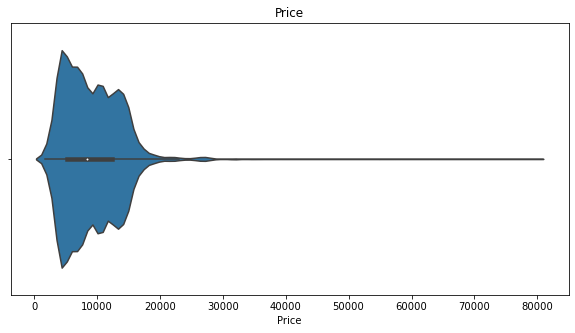

In [203]:
plt.figure(figsize=(10,5))
sns.violinplot(Flight_Train['Price'])
plt.title('Price')

Observation: 
    
Flight prices range highly from Rs:0 to 20000 and are peak at around Rs:6000. 

Text(0.5, 1.0, 'Airline')

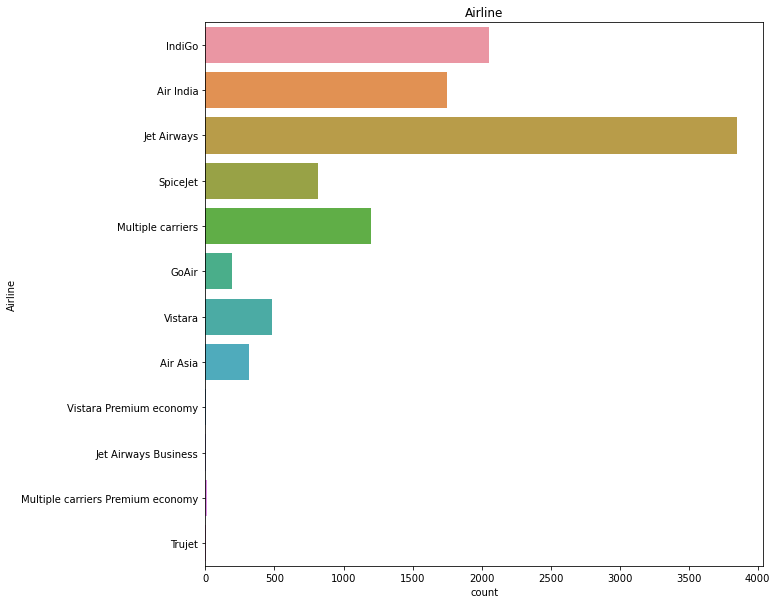

In [204]:
plt.figure(figsize=(10,10))
sns.countplot(y=Flight_Train['Airline'])
plt.title('Airline')

Observation:
    
1)Jet airways flights are the most in the datset.

2)Vistara Premium Economy ,Jet Airways Business ,Multiple carriers premium economy and trujet are least flights in dataset.

3)Other flying flights are Indigo,Air India,Spicejet,Multiple carriers,GoAir,Vistara and Air asia .

Text(0.5, 1.0, 'Destination')

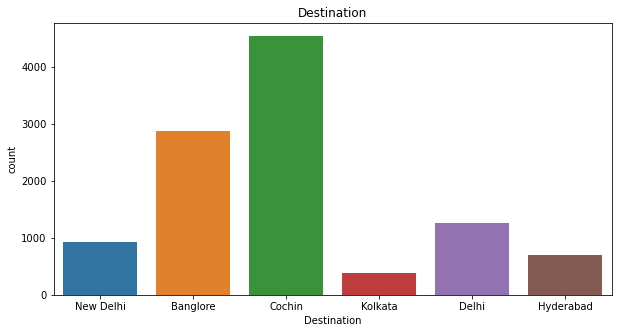

In [205]:
plt.figure(figsize=(10,5))
sns.countplot(Flight_Train['Destination'])
plt.title('Destination')

Observstion:
    
1)Most of the flights are having final destination Cochin.

2)Lest flights in dataset have destination Kolkata.

3)Other destinations where flights are flying upto are New Delhi,Banglore,Delhi and Hyderabad.

Text(0.5, 1.0, 'Flight Source')

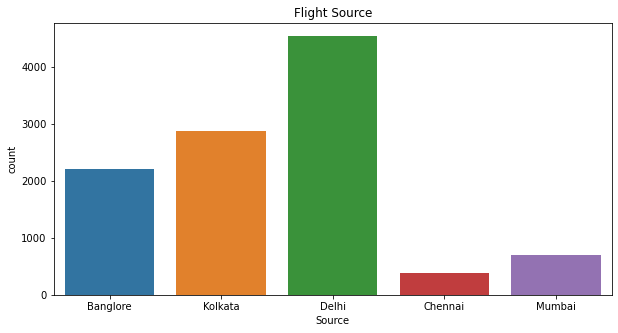

In [206]:
plt.figure(figsize=(10,5))
sns.countplot(Flight_Train['Source'])
plt.title('Flight Source')

Observation:
    
1)Delhi is the source place for most of the flights in dataset.

2)Chennai is the source place for very flights.

3)Flights are also from Banglore ,Kolkata and Mumbai.

Text(0.5, 1.0, 'Total Stops')

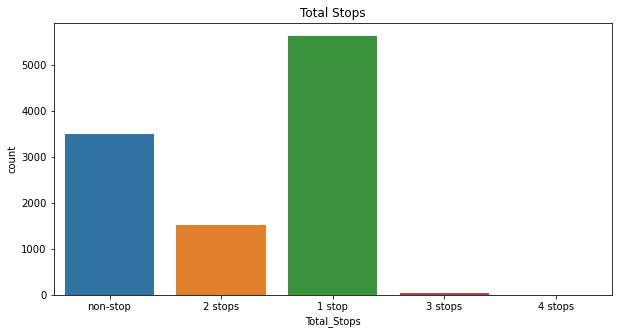

In [207]:
plt.figure(figsize=(10,5))
sns.countplot(Flight_Train['Total_Stops'])
plt.title('Total Stops')

Observation:
    
1)Flights with 1 stop in the journey are the highest in dataset.

2)Non stop flights are the second highest in the dataset.

3)Very few flights are with 3 and 4 stops.

Text(0.5, 1.0, 'Additional info about flights')

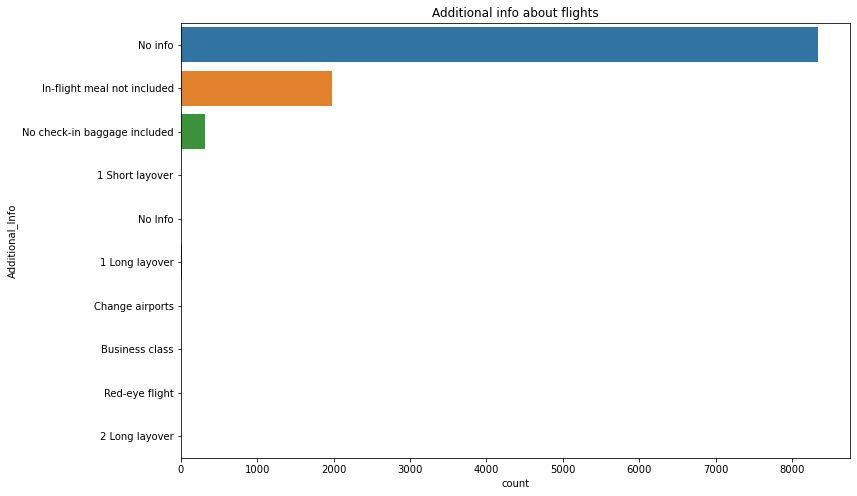

In [208]:
plt.figure(figsize=(12,8))
sns.countplot(y=Flight_Train['Additional_Info'])
plt.title('Additional info about flights')

Observation:
    
1)Most of the columns are not giving us any info.

2)For few fights we get to know that meals is not included and also for few check in baggage isn't included.

3)Other info's what we have got can be considered as not essential.

Text(0.5, 1.0, 'Month')

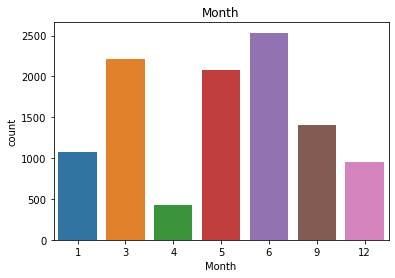

In [209]:
sns.countplot(Flight_Train['Month'])
plt.title('Month')

Observation:
    
1)We have data for most of the flights on june.

2)We have data of very few flights from month of april.

### Bivariate Analysis

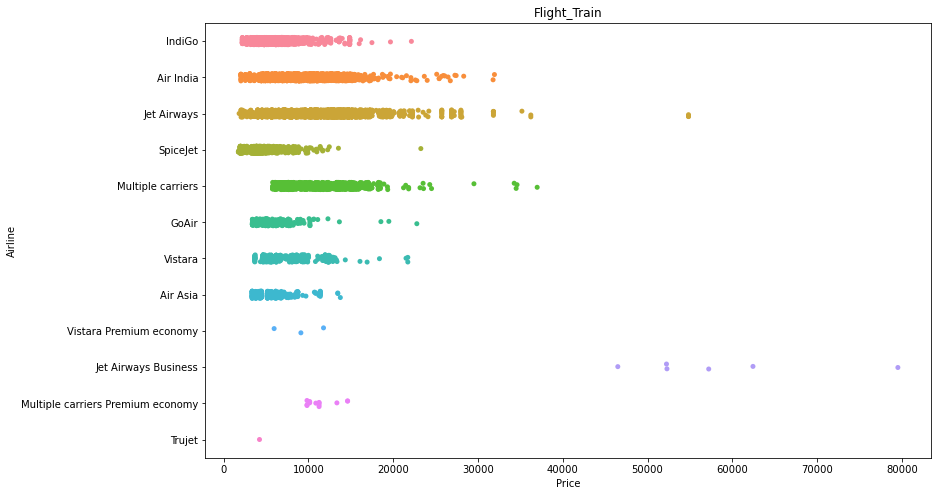

In [210]:
plt.figure(figsize=(13,8))
ax=sns.stripplot(Flight_Train['Price'],Flight_Train['Airline'])
ax.set(ylabel='Airline',xlabel='Price')
plt.title('Flight_Train')
plt.show()

Observation:
    
1)Jet Airways Business ailine price are very high compared to other airlines.

2)IndiGo,Air India,Jet Airways,Spice jet have prices in similar range.

3)GoAir,Vistara and Air Asia have price range in almost similar range.

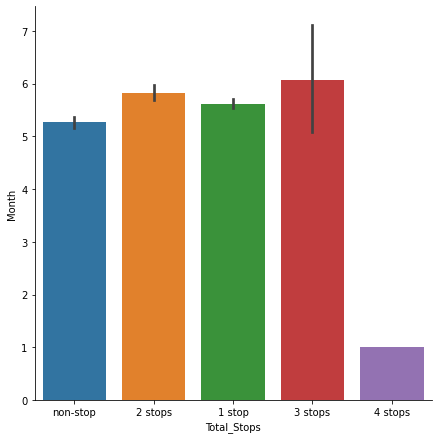

In [211]:
sns.catplot(x='Total_Stops',y='Month',data=Flight_Train,kind='bar',size=6)
plt.show()

Observation:
    
1)Flights in month of jan are having large number of stops.



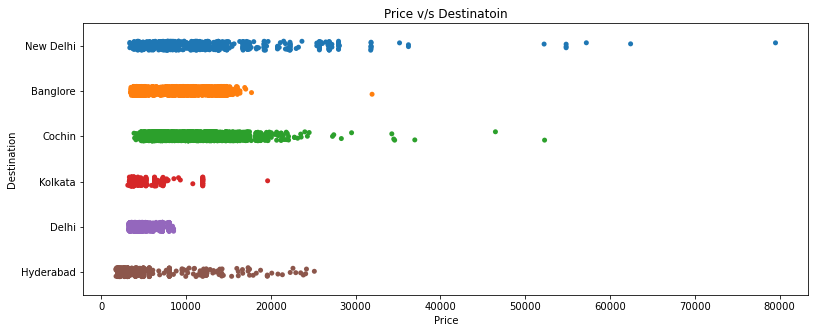

In [212]:
plt.figure(figsize=(13,5))
ax=sns.stripplot(Flight_Train['Price'],Flight_Train['Destination'])
ax.set(ylabel='Destination',xlabel='Price')
plt.title('Price v/s Destinatoin')
plt.show()

Observation:
    
1)The price of flights flying to Delhi is high.

2)Flights with destination kolkata have least fare.


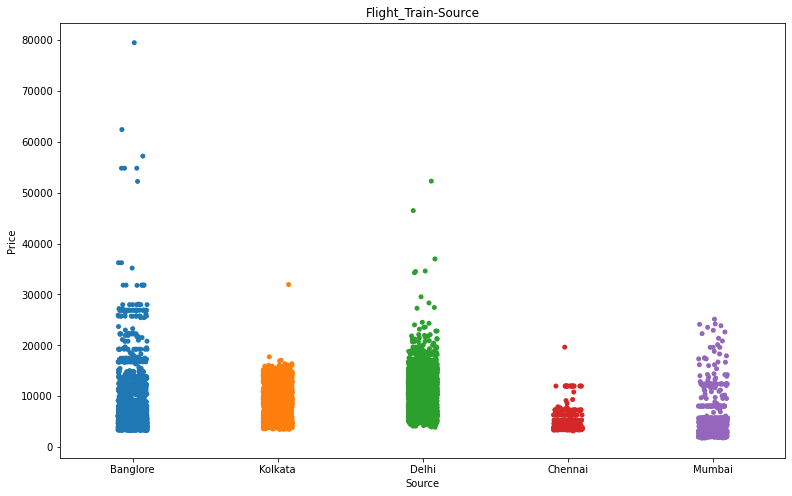

In [213]:
plt.figure(figsize=(13,8))
ax=sns.stripplot(Flight_Train['Source'],Flight_Train['Price'])
ax.set(ylabel='Price',xlabel='Source')
plt.title('Flight_Train-Source')
plt.show()

Observation:
    
1)Charges are at higher side person is flying from Bamglore.

2)Flights taking off from delhi are at second number after banglore in terms of flight charges.

3)Flight flying from mumbai have the cheap prices

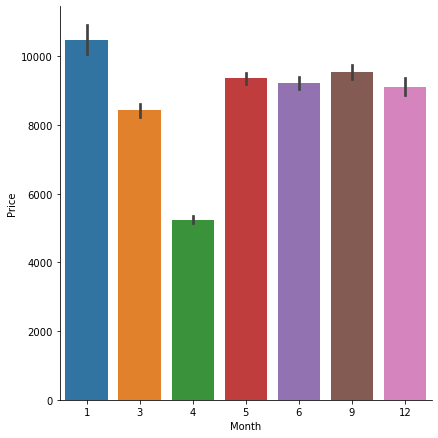

In [214]:
sns.catplot(x='Month',y='Price',data=Flight_Train,kind='bar',size=6)
plt.show()

Observation:
    
1)Flight prices are high in month of jan.

2)Flight prices are least in month of april.

3)Flight prices are similar in month of june,sept and december.

<AxesSubplot:xlabel='Dept_hour', ylabel='Price'>

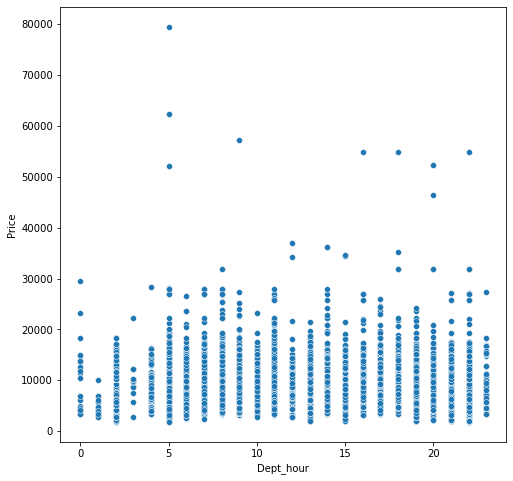

In [215]:
plt.figure(figsize=(8,8))
sns.scatterplot(x='Dept_hour',y='Price',data=Flight_Train)

Observation:
    
1)Flight prices are less during late nights and early mornings.

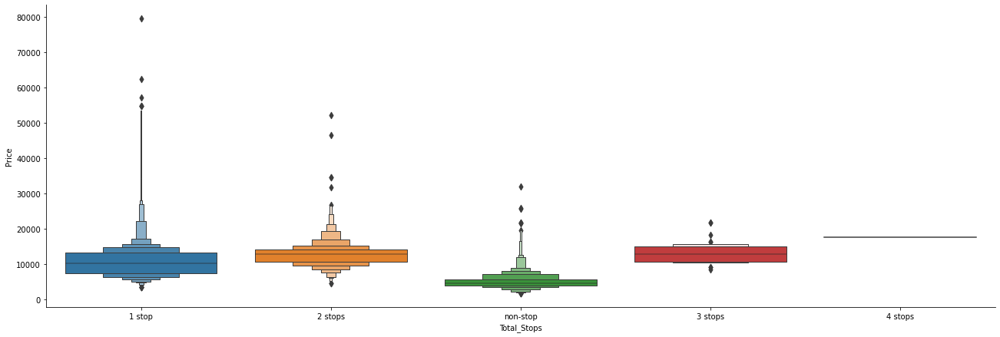

In [216]:
sns.catplot(y='Price',x='Total_Stops',data=Flight_Train.sort_values('Price',ascending=False),kind='boxen',height=6,aspect=3)

Observation:
    
1)Prices are high with 1stop.

2)Flights with no stop tend to have best price.


<Figure size 1080x720 with 0 Axes>

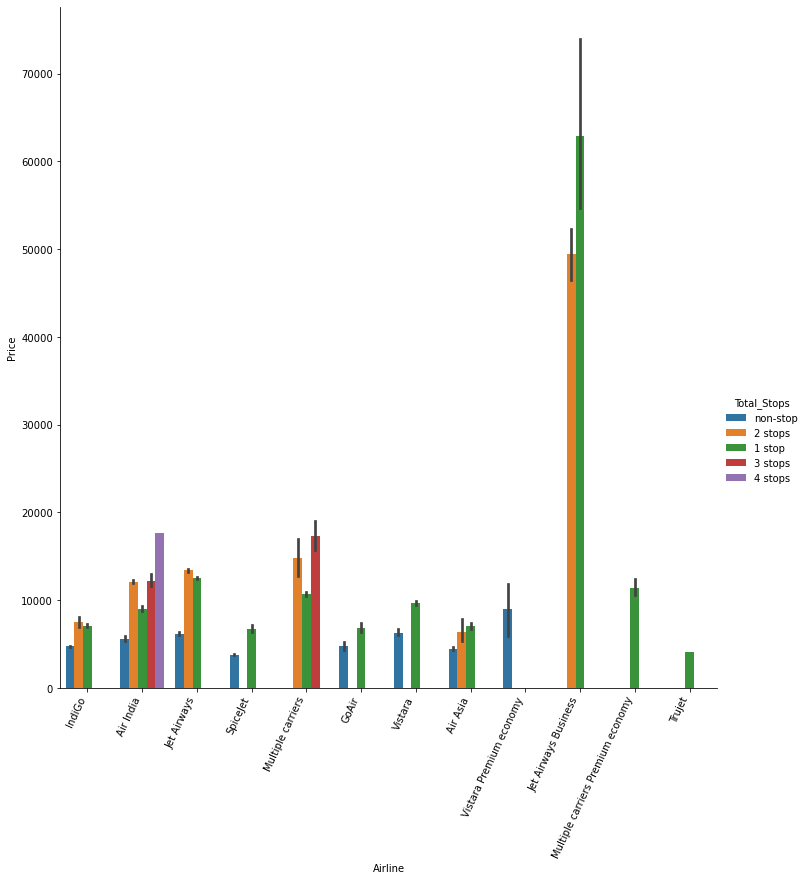

In [217]:
plt.figure(figsize=(15,10))
chart=sns.catplot(x='Airline',y='Price',hue='Total_Stops',data=Flight_Train,kind='bar',size=10)
plt.xticks(rotation=65, horizontalalignment='right')
plt.show()

Observation:
    
1)Air India and Multiple carriers are the only airlines with 3 stops.

2)Trujet,Multiple carriers premium economy airlines have flights with 1 stop and Vistara airlines ahve flights with no stops.

3)Only Air India has got flights with 4 stops.

4)Spice jet,GoAir,Vistara have flights with no stop or 1 stop.

In [218]:
Flight_Train.columns

Index(['Airline', 'Source', 'Destination', 'Route', 'Total_Stops',
       'Additional_Info', 'Price', 'Month', 'Day', 'Dept_hour', 'Dept_min',
       'Arrival_HouR', 'Arrival_MiN', 'Duration_hour', 'Duration_min'],
      dtype='object')

## Multivariate Analysis

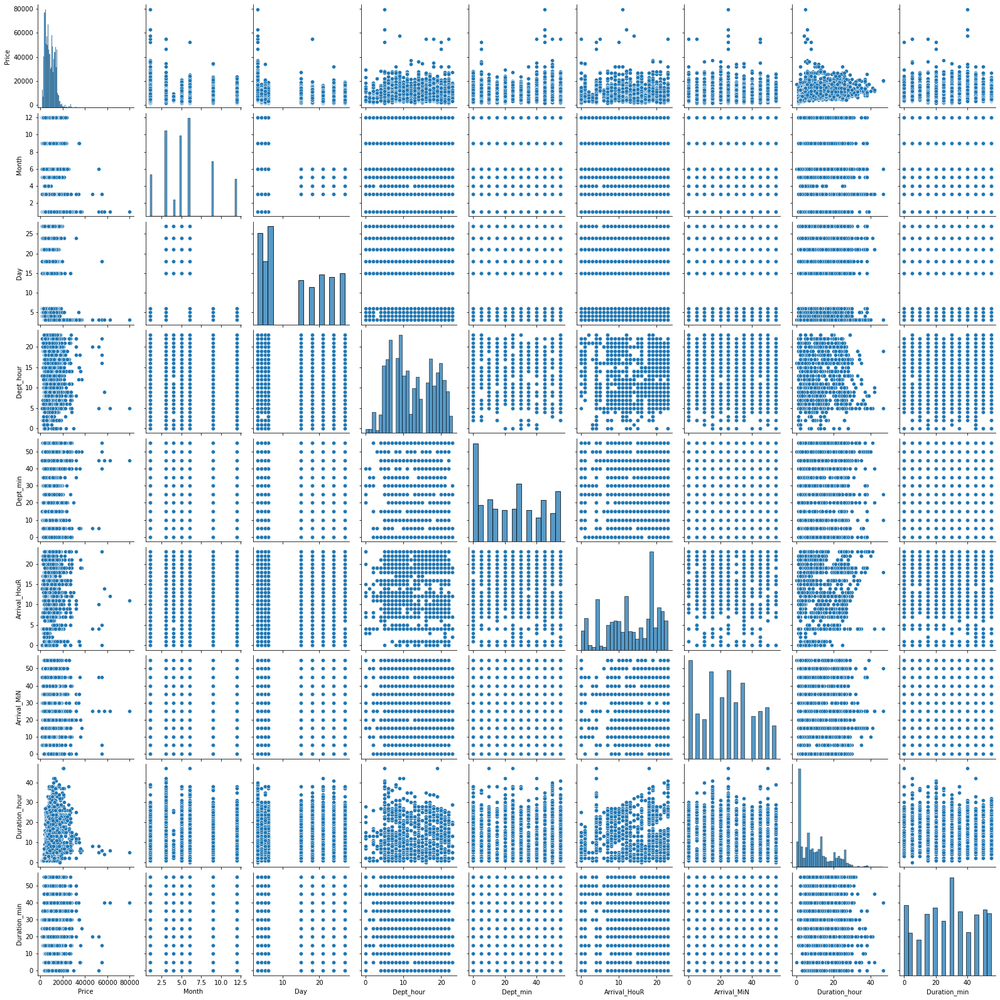

In [219]:
sns.pairplot(Flight_Train)

### Missing Values Treatment

In [220]:
Flight_Train.isnull().sum()

Airline            0
Source             0
Destination        0
Route              1
Total_Stops        1
Additional_Info    0
Price              0
Month              0
Day                0
Dept_hour          0
Dept_min           0
Arrival_HouR       0
Arrival_MiN        0
Duration_hour      0
Duration_min       0
dtype: int64

#### We will replace the NaN value in Route column.

In [221]:
Flight_Train['Route']=Flight_Train['Route'].fillna(Flight_Train['Route'].mode()[0])

#### We will replace the NaN value in Total_Stops columns.

In [222]:
Flight_Train.Total_Stops.unique()

array(['non-stop', '2 stops', '1 stop', '3 stops', nan, '4 stops'],
      dtype=object)

In [223]:
Flight_Train['Total_Stops']=Flight_Train['Total_Stops'].fillna(Flight_Train['Total_Stops'].mode()[0])

#### Delhi and New Delhi are same places ,hence will combine it to one.

In [224]:
Flight_Train['Destination'].replace('New Delhi','Delhi',inplace=True)

In [225]:
Flight_Test['Destination'].replace('New Delhi','Delhi',inplace=True)

In [226]:
Flight_Test.Destination.unique()

array(['Cochin', 'Banglore', 'Delhi', 'Hyderabad', 'Kolkata'],
      dtype=object)

In [227]:
Flight_Train.drop('Additional_Info',inplace=True,axis=1)

In [228]:
Flight_Test.drop('Additional_Info',inplace=True,axis=1)

In [229]:
Flight_Test.insert

<bound method DataFrame.insert of                                 Airline    Source Destination  \
0                           Jet Airways     Delhi      Cochin   
1                                IndiGo   Kolkata    Banglore   
2                           Jet Airways     Delhi      Cochin   
3                     Multiple carriers     Delhi      Cochin   
4                              Air Asia  Banglore       Delhi   
5                           Jet Airways     Delhi      Cochin   
6                             Air India  Banglore       Delhi   
7                                IndiGo   Kolkata    Banglore   
8                                IndiGo   Kolkata    Banglore   
9                           Jet Airways   Kolkata    Banglore   
10                          Jet Airways     Delhi      Cochin   
11                               IndiGo     Delhi      Cochin   
12                    Multiple carriers     Delhi      Cochin   
13                          Jet Airways  Banglore       

In [230]:
Flight_Train.Destination.unique()

array(['Delhi', 'Banglore', 'Cochin', 'Kolkata', 'Hyderabad'],
      dtype=object)

In [231]:
Flight_Train.isnull().sum()

Airline          0
Source           0
Destination      0
Route            0
Total_Stops      0
Price            0
Month            0
Day              0
Dept_hour        0
Dept_min         0
Arrival_HouR     0
Arrival_MiN      0
Duration_hour    0
Duration_min     0
dtype: int64

In [232]:
Flight_Train.shape

(10683, 14)

In [233]:
Flight_Test.shape

(2671, 13)

## Correlation

In [234]:
Flight_Train.corr()

,Price,Month,Day,Dept_hour,Dept_min,Arrival_HouR,Arrival_MiN,Duration_hour,Duration_min
Price,1.000000,0.010700,-0.165412,0.006819,-0.024492,0.024264,-0.086155,0.508672,-0.124874
Month,0.010700,1.000000,-0.264899,0.028180,0.002152,-0.004338,-0.025786,0.055568,-0.018587
Day,-0.165412,-0.264899,1.000000,-0.002251,-0.016521,-0.002124,-0.021424,-0.038081,-0.007764
Dept_hour,0.006819,0.028180,-0.002251,1.000000,-0.024806,0.005215,0.067909,0.002783,-0.023746
Dept_min,-0.024492,0.002152,-0.016521,-0.024806,1.000000,0.043054,-0.017594,-0.021946,0.092548
Arrival_HouR,0.024264,-0.004338,-0.002124,0.005215,0.043054,1.000000,-0.154362,0.055180,-0.118345
Arrival_MiN,-0.086155,-0.025786,-0.021424,0.067909,-0.017594,-0.154362,1.000000,-0.074439,0.151626
Duration_hour,0.508672,0.055568,-0.038081,0.002783,-0.021946,0.055180,-0.074439,1.000000,-0.126355
Duration_min,-0.124874,-0.018587,-0.007764,-0.023746,0.092548,-0.118345,0.151626,-0.126355,1.000000


Above is table justifying the correlation.

#### Heat Map

<AxesSubplot:>

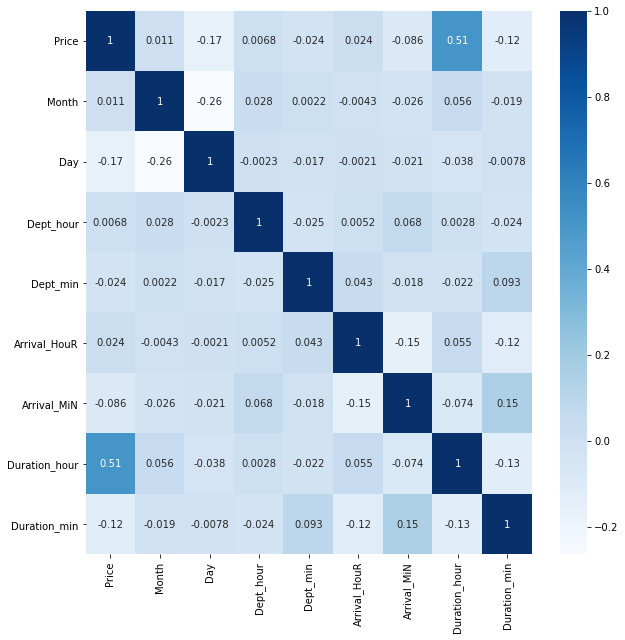

In [235]:
plt.figure(figsize=(10,10))
sns.heatmap(Flight_Train.corr(),annot=True,cmap='Blues')

Observation:

1)Duration_hour and price are most correlated columns in the dataset.

2)Day and month are negatively correlated columns.


## Outliers

##### We will check the outliers in dataset.

In [236]:
Flight_Train.describe()

,Price,Month,Day,Dept_hour,Dept_min,Arrival_HouR,Arrival_MiN,Duration_hour,Duration_min
count,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000
mean,9087.064121,5.534775,12.682205,12.490686,24.411214,13.348778,24.690630,10.246092,28.327717
std,4611.359167,2.987489,8.803701,5.748650,18.767980,6.859125,16.506036,8.495414,16.945400
min,1759.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5277.000000,3.000000,5.000000,8.000000,5.000000,8.000000,10.000000,2.000000,15.000000
50%,8372.000000,5.000000,6.000000,11.000000,25.000000,14.000000,25.000000,8.000000,30.000000
75%,12373.000000,6.000000,21.000000,18.000000,40.000000,19.000000,35.000000,15.000000,45.000000
max,79512.000000,12.000000,27.000000,23.000000,55.000000,23.000000,55.000000,47.000000,55.000000


Observation:
    
1)There is huge difference between 755% and max value of price  and Duration_hour column.

2)There is no major difference between mean and median of the columns.

In [237]:
Flight_Train.columns

Index(['Airline', 'Source', 'Destination', 'Route', 'Total_Stops', 'Price',
       'Month', 'Day', 'Dept_hour', 'Dept_min', 'Arrival_HouR', 'Arrival_MiN',
       'Duration_hour', 'Duration_min'],
      dtype='object')

In [238]:
ncols,nrows = (3,5)

In [239]:
CN=['Price', 'Month', 'Day', 'Dept_hour', 'Dept_min','Arrival_HouR', 'Arrival_MiN', 'Duration_hour', 'Duration_min']
CN    

['Price',
 'Month',
 'Day',
 'Dept_hour',
 'Dept_min',
 'Arrival_HouR',
 'Arrival_MiN',
 'Duration_hour',
 'Duration_min']

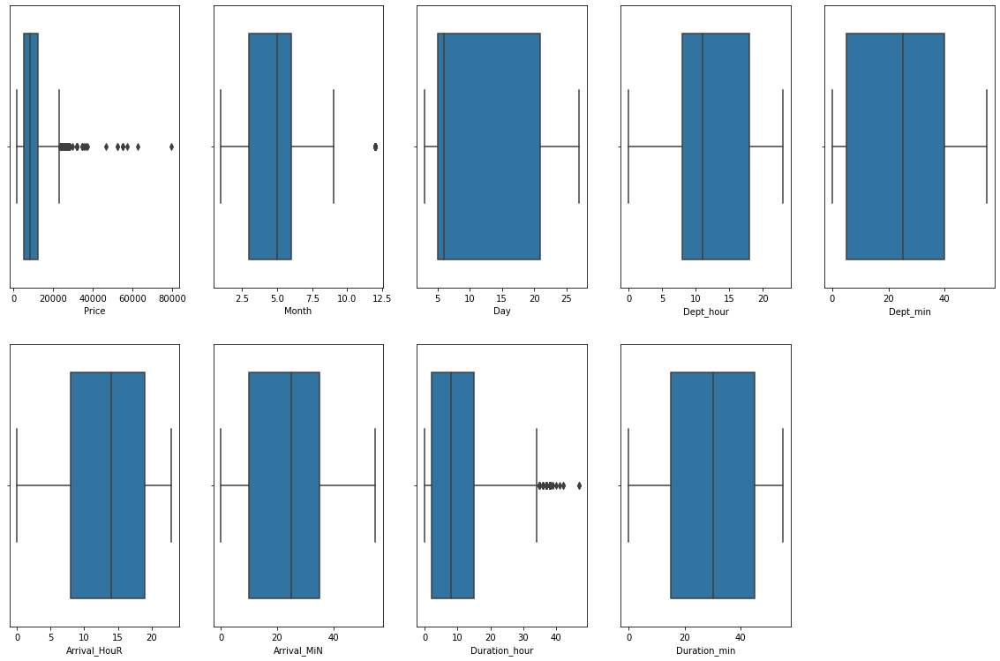

In [240]:
plt.figure(figsize=(20,20))
for index,col in enumerate(CN):
    plt.subplot(ncols,nrows,index+1)
    sns.boxplot(Flight_Train[CN[index]])

##### We will treat the outlier from Price and Duration_hour columns with soft capping method

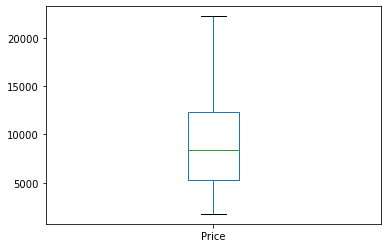

In [241]:
q4=Flight_Train['Price'].quantile(0.99)
Flight_Train['Price'][Flight_Train['Price']>q4]=q4
Flight_Train['Price'].plot.box()
plt.show()

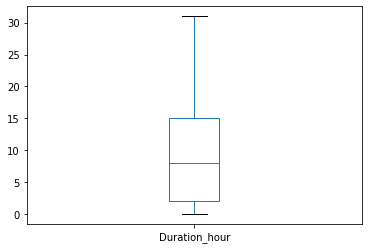

In [242]:
q4=Flight_Train['Duration_hour'].quantile(0.99)
Flight_Train['Duration_hour'][Flight_Train['Duration_hour']>q4]=q4
Flight_Train['Duration_hour'].plot.box()
plt.show()

###### Outliers are cleared from both the columns

## Encoding

In [243]:
Flight_Train.columns

Index(['Airline', 'Source', 'Destination', 'Route', 'Total_Stops', 'Price',
       'Month', 'Day', 'Dept_hour', 'Dept_min', 'Arrival_HouR', 'Arrival_MiN',
       'Duration_hour', 'Duration_min'],
      dtype='object')

In [244]:
Flight_Test.columns

Index(['Airline', 'Source', 'Destination', 'Route', 'Total_Stops', 'Month',
       'Day', 'Dept_hour', 'Dept_min', 'Arrival_HouR', 'Arrival_MiN',
       'Duration_hour', 'Duration_min'],
      dtype='object')

##### We will apply One hot encoder on Airline,Source,Destination,Total_Stops,Additional_Info columns

In [245]:
LOHC=['Airline', 'Source', 'Destination', 'Total_Stops']
LOHC

['Airline', 'Source', 'Destination', 'Total_Stops']

In [246]:
from sklearn.preprocessing import OneHotEncoder

In [247]:
OHC=OneHotEncoder(handle_unknown='ignore', sparse=False)

In [248]:
for i in LOHC:
    Flight_Train=pd.get_dummies(data=Flight_Train, columns=[i])

In [249]:
for i in LOHC:
    Flight_Test=pd.get_dummies(data=Flight_Test, columns=[i])

In [250]:
Flight_Train.head()

,Route,Price,Month,Day,Dept_hour,Dept_min,Arrival_HouR,Arrival_MiN,Duration_hour,Duration_min,Airline_Air Asia,Airline_Air India,Airline_GoAir,Airline_IndiGo,Airline_Jet Airways,Airline_Jet Airways Business,Airline_Multiple carriers,Airline_Multiple carriers Premium economy,Airline_SpiceJet,Airline_Trujet,Airline_Vistara,Airline_Vistara Premium economy,Source_Banglore,Source_Chennai,Source_Delhi,Source_Kolkata,Source_Mumbai,Destination_Banglore,Destination_Cochin,Destination_Delhi,Destination_Hyderabad,Destination_Kolkata,Total_Stops_1 stop,Total_Stops_2 stops,Total_Stops_3 stops,Total_Stops_4 stops,Total_Stops_non-stop
0,BLR → DEL,3897,3,24,22,20,1,10,2,50,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1
1,CCU → IXR → BBI → BLR,7662,1,5,5,50,13,15,7,25,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0
2,DEL → LKO → BOM → COK,13882,9,6,9,25,4,25,19,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0
3,CCU → NAG → BLR,6218,12,5,18,5,23,30,5,25,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0
4,BLR → NAG → DEL,13302,1,3,16,50,21,35,4,45,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0


In [251]:
Flight_Test.head()

,Route,Month,Day,Dept_hour,Dept_min,Arrival_HouR,Arrival_MiN,Duration_hour,Duration_min,Airline_Air Asia,Airline_Air India,Airline_GoAir,Airline_IndiGo,Airline_Jet Airways,Airline_Jet Airways Business,Airline_Multiple carriers,Airline_Multiple carriers Premium economy,Airline_SpiceJet,Airline_Vistara,Airline_Vistara Premium economy,Source_Banglore,Source_Chennai,Source_Delhi,Source_Kolkata,Source_Mumbai,Destination_Banglore,Destination_Cochin,Destination_Delhi,Destination_Hyderabad,Destination_Kolkata,Total_Stops_1 stop,Total_Stops_2 stops,Total_Stops_3 stops,Total_Stops_4 stops,Total_Stops_non-stop
0,DEL → BOM → COK,6,6,17,30,4,25,10,55,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0
1,CCU → MAA → BLR,12,5,6,20,10,20,4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0
2,DEL → BOM → COK,5,21,19,15,19,0,23,45,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0
3,DEL → BOM → COK,5,21,8,0,21,0,13,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0
4,BLR → DEL,6,24,23,55,2,45,2,50,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1


###### We will drop the Route column as we have got total stops of flight,take off place and destination place.The route doesn't matter.

In [252]:
Flight_Train.drop('Route',axis=1,inplace=True)

In [253]:
Flight_Test.drop('Route',axis=1,inplace=True)

In [254]:
Flight_Train.head()

,Price,Month,Day,Dept_hour,Dept_min,Arrival_HouR,Arrival_MiN,Duration_hour,Duration_min,Airline_Air Asia,Airline_Air India,Airline_GoAir,Airline_IndiGo,Airline_Jet Airways,Airline_Jet Airways Business,Airline_Multiple carriers,Airline_Multiple carriers Premium economy,Airline_SpiceJet,Airline_Trujet,Airline_Vistara,Airline_Vistara Premium economy,Source_Banglore,Source_Chennai,Source_Delhi,Source_Kolkata,Source_Mumbai,Destination_Banglore,Destination_Cochin,Destination_Delhi,Destination_Hyderabad,Destination_Kolkata,Total_Stops_1 stop,Total_Stops_2 stops,Total_Stops_3 stops,Total_Stops_4 stops,Total_Stops_non-stop
0,3897,3,24,22,20,1,10,2,50,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1
1,7662,1,5,5,50,13,15,7,25,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0
2,13882,9,6,9,25,4,25,19,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0
3,6218,12,5,18,5,23,30,5,25,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0
4,13302,1,3,16,50,21,35,4,45,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0


In [255]:
Flight_Test.head()

,Month,Day,Dept_hour,Dept_min,Arrival_HouR,Arrival_MiN,Duration_hour,Duration_min,Airline_Air Asia,Airline_Air India,Airline_GoAir,Airline_IndiGo,Airline_Jet Airways,Airline_Jet Airways Business,Airline_Multiple carriers,Airline_Multiple carriers Premium economy,Airline_SpiceJet,Airline_Vistara,Airline_Vistara Premium economy,Source_Banglore,Source_Chennai,Source_Delhi,Source_Kolkata,Source_Mumbai,Destination_Banglore,Destination_Cochin,Destination_Delhi,Destination_Hyderabad,Destination_Kolkata,Total_Stops_1 stop,Total_Stops_2 stops,Total_Stops_3 stops,Total_Stops_4 stops,Total_Stops_non-stop
0,6,6,17,30,4,25,10,55,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0
1,12,5,6,20,10,20,4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0
2,5,21,19,15,19,0,23,45,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0
3,5,21,8,0,21,0,13,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0
4,6,24,23,55,2,45,2,50,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1


In [256]:
Flight_Train.shape

(10683, 36)

In [257]:
Flight_Test.shape

(2671, 34)

In [258]:
Flight_Test=Flight_Test.assign(Airline_Trujet = "0")

In [259]:
Flight_Test.head()

,Month,Day,Dept_hour,Dept_min,Arrival_HouR,Arrival_MiN,Duration_hour,Duration_min,Airline_Air Asia,Airline_Air India,Airline_GoAir,Airline_IndiGo,Airline_Jet Airways,Airline_Jet Airways Business,Airline_Multiple carriers,Airline_Multiple carriers Premium economy,Airline_SpiceJet,Airline_Vistara,Airline_Vistara Premium economy,Source_Banglore,Source_Chennai,Source_Delhi,Source_Kolkata,Source_Mumbai,Destination_Banglore,Destination_Cochin,Destination_Delhi,Destination_Hyderabad,Destination_Kolkata,Total_Stops_1 stop,Total_Stops_2 stops,Total_Stops_3 stops,Total_Stops_4 stops,Total_Stops_non-stop,Airline_Trujet
0,6,6,17,30,4,25,10,55,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
1,12,5,6,20,10,20,4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0
2,5,21,19,15,19,0,23,45,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
3,5,21,8,0,21,0,13,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
4,6,24,23,55,2,45,2,50,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0


## Data Spliting

In [260]:
x=Flight_Train.drop('Price',axis=1)
y=Flight_Train.iloc[:,0:1]

In [261]:
x.shape

(10683, 35)

In [262]:
y.shape

(10683, 1)

### Skewness

In [263]:
x.skew()

Month                                          0.629540
Day                                            0.367373
Dept_hour                                      0.113073
Dept_min                                       0.167029
Arrival_HouR                                  -0.369988
Arrival_MiN                                    0.110945
Duration_hour                                  0.758279
Duration_min                                  -0.090841
Airline_Air Asia                               5.525249
Airline_Air India                              1.815130
Airline_GoAir                                  7.218042
Airline_IndiGo                                 1.562748
Airline_Jet Airways                            0.582095
Airline_Jet Airways Business                  42.166335
Airline_Multiple carriers                      2.461716
Airline_Multiple carriers Premium economy     28.618184
Airline_SpiceJet                               3.185227
Airline_Trujet                               103

Skewness of all columns required is within the limit.

In [264]:
Flight_Test.skew()

Month                                         0.590701
Day                                           0.478246
Dept_hour                                     0.093759
Dept_min                                      0.128515
Arrival_HouR                                 -0.443166
Arrival_MiN                                   0.115267
Duration_hour                                 0.884647
Duration_min                                 -0.104482
Airline_Air Asia                              5.303111
Airline_Air India                             1.808687
Airline_GoAir                                 7.425946
Airline_IndiGo                                1.570462
Airline_Jet Airways                           0.695618
Airline_Jet Airways Business                 36.523949
Airline_Multiple carriers                     2.202763
Airline_Multiple carriers Premium economy    29.804900
Airline_SpiceJet                              3.152294
Airline_Vistara                               4.216176
Airline_Vi

## Scaling

In [265]:
from sklearn.preprocessing import MinMaxScaler

In [266]:
scaler=MinMaxScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)

In [267]:
x.head()

,Month,Day,Dept_hour,Dept_min,Arrival_HouR,Arrival_MiN,Duration_hour,Duration_min,Airline_Air Asia,Airline_Air India,Airline_GoAir,Airline_IndiGo,Airline_Jet Airways,Airline_Jet Airways Business,Airline_Multiple carriers,Airline_Multiple carriers Premium economy,Airline_SpiceJet,Airline_Trujet,Airline_Vistara,Airline_Vistara Premium economy,Source_Banglore,Source_Chennai,Source_Delhi,Source_Kolkata,Source_Mumbai,Destination_Banglore,Destination_Cochin,Destination_Delhi,Destination_Hyderabad,Destination_Kolkata,Total_Stops_1 stop,Total_Stops_2 stops,Total_Stops_3 stops,Total_Stops_4 stops,Total_Stops_non-stop
0,0.181818,0.875000,0.956522,0.363636,0.043478,0.181818,0.064516,0.909091,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.000000,0.083333,0.217391,0.909091,0.565217,0.272727,0.225806,0.454545,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.727273,0.125000,0.391304,0.454545,0.173913,0.454545,0.612903,0.000000,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,1.000000,0.083333,0.782609,0.090909,1.000000,0.545455,0.161290,0.454545,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.695652,0.909091,0.913043,0.636364,0.129032,0.818182,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [268]:
x.shape

(10683, 35)

In [269]:
scaler=MinMaxScaler()
Flight_Test=pd.DataFrame(scaler.fit_transform(Flight_Test),columns=Flight_Test.columns)

In [270]:
Flight_Test.head()

,Month,Day,Dept_hour,Dept_min,Arrival_HouR,Arrival_MiN,Duration_hour,Duration_min,Airline_Air Asia,Airline_Air India,Airline_GoAir,Airline_IndiGo,Airline_Jet Airways,Airline_Jet Airways Business,Airline_Multiple carriers,Airline_Multiple carriers Premium economy,Airline_SpiceJet,Airline_Vistara,Airline_Vistara Premium economy,Source_Banglore,Source_Chennai,Source_Delhi,Source_Kolkata,Source_Mumbai,Destination_Banglore,Destination_Cochin,Destination_Delhi,Destination_Hyderabad,Destination_Kolkata,Total_Stops_1 stop,Total_Stops_2 stops,Total_Stops_3 stops,Total_Stops_4 stops,Total_Stops_non-stop,Airline_Trujet
0,0.454545,0.125000,0.739130,0.545455,0.173913,0.454545,0.250,1.000000,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,1.000000,0.083333,0.260870,0.363636,0.434783,0.363636,0.100,0.000000,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,0.363636,0.750000,0.826087,0.272727,0.826087,0.000000,0.575,0.818182,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.363636,0.750000,0.347826,0.000000,0.913043,0.000000,0.325,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.454545,0.875000,1.000000,1.000000,0.086957,0.818182,0.050,0.909091,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [271]:
Flight_Test.shape

(2671, 35)

#### Data is ready for model execution after treating the missing values,encoding,removing skewness and scaling

## MODEL EXECUTION

#### Check the best random_state for model running

In [272]:
maxAccu=0
maxRS=0

for i in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=i)
    LR=LinearRegression()
    LR.fit(x_train,y_train)
    predl=LR.predict(x_test)
    ac=r2_score(y_test,predl)
    
    if ac>maxAccu:
        maxAccu=ac
        maxRS=i
        
print('Best r2_score at x is',maxAccu*100,'at random state',maxRS) 

Best r2_score at x is 64.98750159849081 at random state 39


### Linear Regresion

In [273]:
print('error')

print('Mean absolute error',mean_absolute_error(y_test,predl))
print('Mean squared error',mean_squared_error(y_test,predl))


print('Root mean squared error',np.sqrt(mean_squared_error(y_test,predl)))

error
Mean absolute error 1952.548745178054
Mean squared error 6706443.71346152
Root mean squared error 2589.6802338245393


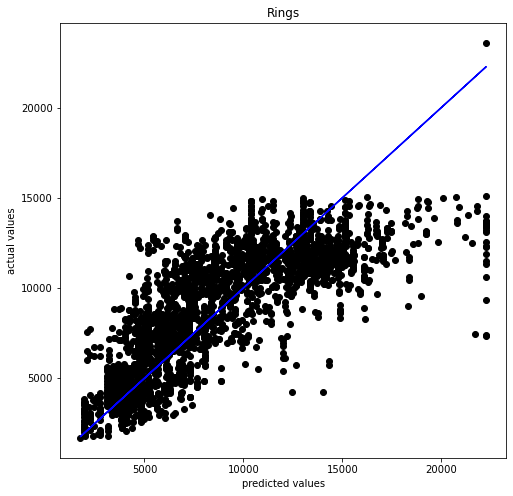

In [274]:
plt.figure(figsize=(8,8))
plt.scatter(x=y_test,y=predl,color='k')
plt.plot(y_test,y_test,color='b')
plt.xlabel('predicted values')
plt.ylabel('actual values')
plt.title('Rings')
plt.show()

### Hyper Parameter Tunning for Linear Regression Model

In [275]:
from sklearn.model_selection import GridSearchCV

model =LinearRegression()
parameters = {'fit_intercept':[True,False], 'normalize':[True,False], 'copy_X':[True, False]}
grid = GridSearchCV(model,parameters, cv=5)
grid.fit(x_train,y_train)
grid.best_params_

{'copy_X': True, 'fit_intercept': False, 'normalize': True}

After hyper parameter we have found these are best parameters ---->'copy_X': True, 'fit_intercept': True, 'normalize': False

In [276]:
predx=grid.predict(x_test)
R2_score=r2_score(y_test,predx)
R2_score*100

62.668956543003596

R2_score for best parameters using linear regression model is 70.34%.

In [277]:
print('Error')

print('Mean absolute error',mean_absolute_error(y_test,predx))
print('Mean squared error',mean_squared_error(y_test,predx))


print('Root mean squared error',np.sqrt(mean_squared_error(y_test,predx)))

Error
Mean absolute error 1953.774106992557
Mean squared error 6726298.2624975005
Root mean squared error 2593.5107986082303


##### Applying hyper parameter tunning for Linear Regression r2_score is 70.34%.

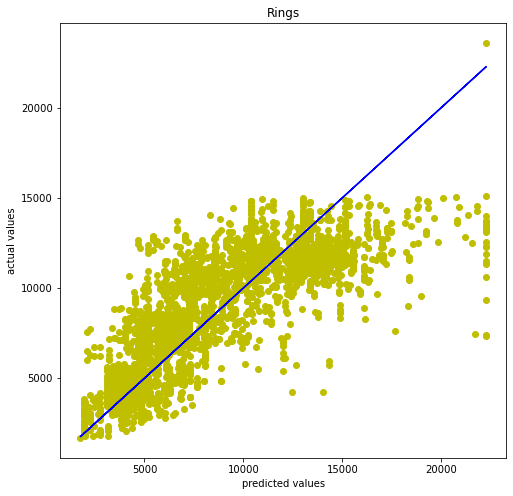

In [278]:
plt.figure(figsize=(8,8))
plt.scatter(x=y_test,y=predx,color='y')
plt.plot(y_test,y_test,color='b')
plt.xlabel('predicted values')
plt.ylabel('actual values')
plt.title('Rings')
plt.show()

### Random Forest Regressor

In [279]:
from sklearn.ensemble import RandomForestRegressor
rdr = RandomForestRegressor()
rdr.fit(x_train,y_train)
predrdr=rdr.predict(x_test)
print('The r2_score using ridge is:',r2_score(y_test,predrdr)*100)

The r2_score using ridge is: 81.68571579125769


In [280]:
print('error')

print('Mean absolute error',mean_absolute_error(y_test,predrdr))
print('Mean squared error',mean_squared_error(y_test,predrdr))


print('Root mean squared error',np.sqrt(mean_squared_error(y_test,predrdr)))

error
Mean absolute error 1178.8125314697004
Mean squared error 3299863.241006235
Root mean squared error 1816.5525703943267


##### R2_score for random forest regressor model is 92.38% which is also better than linear regression models.

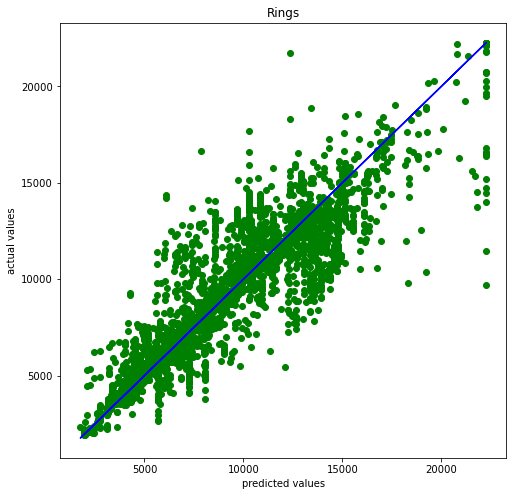

In [281]:
plt.figure(figsize=(8,8))
plt.scatter(x=y_test,y=predrdr,color='g')
plt.plot(y_test,y_test,color='b')
plt.xlabel('predicted values')
plt.ylabel('actual values')
plt.title('Rings')
plt.show()

#### Hyperparameter Tunning for Random Forest Regressor

In [282]:
%%time
modelr =RandomForestRegressor()
parameters = {
    
    'max_depth': [ 50, 60, 70, 80, 90, 100],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10]
             }

gridrfr = GridSearchCV(modelr,parameters,cv=5)
gridrfr.fit(x_train,y_train)
gridrfr.best_params_

Wall time: 21min 55s


{'max_depth': 70,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 10}

In [283]:
predrfr=gridrfr.predict(x_test)
R2_score=r2_score(y_test,predrfr)
print('The R2_score for cv=7 is :',(R2_score*100))

The R2_score for cv=7 is : 83.84112500560376


##### After Hyper parameter tunning of random forest regressor our score has improved from 92.38 to 92.47%

In [284]:
print('Error')

print('Mean absolute error',mean_absolute_error(y_test,predrfr))
print('Mean squared error',mean_squared_error(y_test,predrfr))


print('Root mean squared error',np.sqrt(mean_squared_error(y_test,predrfr)))

Error
Mean absolute error 1139.8396662848256
Mean squared error 2911502.1369259832
Root mean squared error 1706.3124382498017


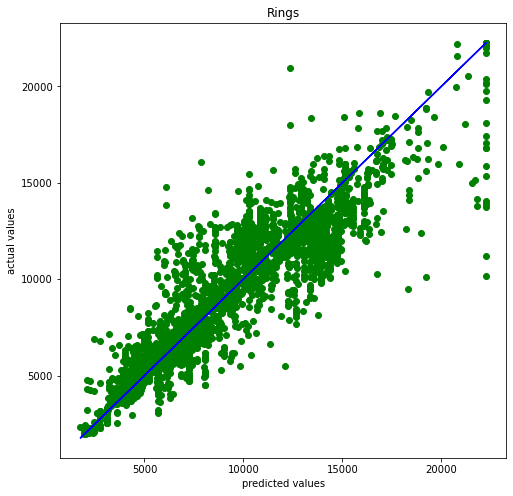

In [285]:
plt.figure(figsize=(8,8))
plt.scatter(x=y_test,y=predrfr,color='g')
plt.plot(y_test,y_test,color='b')
plt.xlabel('predicted values')
plt.ylabel('actual values')
plt.title('Rings')
plt.show()

### XGBoost Regressor Model

In [286]:
XGB = XGBRegressor()
XGB.fit(x_train,y_train)
pred_xgb=XGB.predict(x_test)
print('The r2_score using ridge is:',r2_score(y_test,pred_xgb)*100)

The r2_score using ridge is: 84.90186712661367


##### R2_score for XGBoost regressor model is 92.62% which is also better than other models.

In [287]:
print('Error')

print('Mean absolute error',mean_absolute_error(y_test,pred_xgb))
print('Mean squared error',mean_squared_error(y_test,pred_xgb))
print('Root mean squared error',np.sqrt(mean_squared_error(y_test,pred_xgb)))

Error
Mean absolute error 1142.0824627047582
Mean squared error 2720377.8814862445
Root mean squared error 1649.356808421466


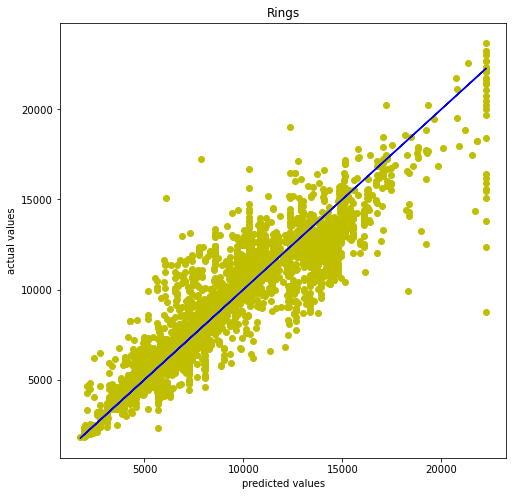

In [288]:
plt.figure(figsize=(8,8))
plt.scatter(x=y_test,y=pred_xgb,color='y')
plt.plot(y_test,y_test,color='b')
plt.xlabel('predicted values')
plt.ylabel('actual values')
plt.title('Rings')
plt.show()

#### Hyperparameter Tunning for XGBoost Regressor

In [289]:
modelx =XGBRegressor()
parameters = {'max_depth':[1,4,6,10],'eta':[0.001,0.01,0.3,0.2],'subsample':[0.2,0.5,0.6]}
gridx = GridSearchCV(modelx,parameters,cv=3)
gridx.fit(x_train,y_train)
gridx.best_params_

{'eta': 0.2, 'max_depth': 6, 'subsample': 0.6}

In [290]:
predxg=gridx.predict(x_test)
R2_score=r2_score(y_test,predxg)
print('The R2_score for cv=3 is :',(R2_score*100))

The R2_score for cv=3 is : 84.23344074925002


###### After Hyper parameter tunning of random forest regressor our score has reduced from 92.62 to 92.20%

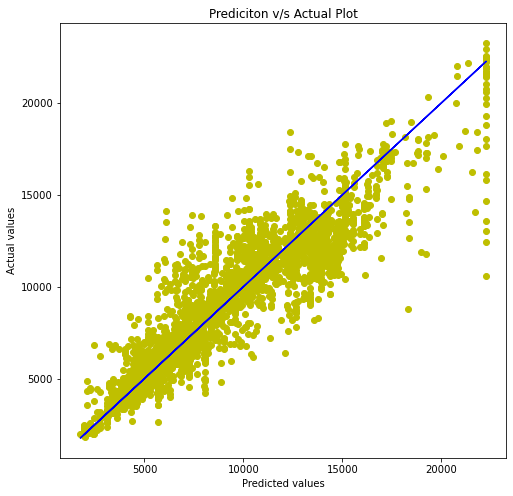

In [291]:
plt.figure(figsize=(8,8))
plt.scatter(x=y_test,y=predxg,color='y')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Predicted values')
plt.ylabel('Actual values')
plt.title('Prediciton v/s Actual Plot')
plt.show()

In [292]:
print('error')

print('Mean absolute error',mean_absolute_error(y_test,predxg))
print('Mean squared error',mean_squared_error(y_test,predxg))
print('Root mean squared error',np.sqrt(mean_squared_error(y_test,predxg)))

error
Mean absolute error 1176.4397894753681
Mean squared error 2840814.782368693
Root mean squared error 1685.471679491736


### Regularization

In [293]:
from sklearn.linear_model import Lasso,Ridge,ElasticNet

### Lasso

In [294]:
from sklearn.model_selection import GridSearchCV
ls=Lasso()
param= {'alpha':[0.0001,0.001,0.01,0.05,0.1,0.2,0.4,0.6,0.8,1.0,2.0,5.0,10.0,100.0]}

model_cvls=GridSearchCV(estimator=ls,param_grid=param,scoring='neg_mean_absolute_error',cv=9,return_train_score=True,verbose=1)

model_cvls.fit(x_train,y_train)
model_cvls.best_params_

Fitting 9 folds for each of 14 candidates, totalling 126 fits


{'alpha': 0.2}

In [295]:
ls=Lasso(alpha=0.04)
ls.fit(x_train,y_train)
ls.score(x_train,y_train)
pred_ls=ls.predict(x_test)
print('The r2_score using lasso is:',r2_score(y_test,pred_ls)*100)

The r2_score using lasso is: 62.71809675809443


In [296]:
print('Error')

print('Mean absolute error',mean_absolute_error(y_test,pred_ls))
print('Mean squared error',mean_squared_error(y_test,pred_ls))


print('Root mean squared error',np.sqrt(mean_squared_error(y_test,pred_ls)))

Error
Mean absolute error 1953.2698186569933
Mean squared error 6717444.190583732
Root mean squared error 2591.8032700387835


Applying hyper parameter tunning for lasso regularization our score is 70.29%.

In [297]:
ls.coef_

array([-1.00377536e+03, -1.81502348e+03,  2.80025323e+02, -1.35352918e+02,
       -2.13518471e+02,  2.39911012e+02,  1.67959403e+02, -6.37103251e+01,
       -2.20767397e+03, -5.65645528e+02, -2.31080686e+03, -2.03098258e+03,
        1.71099191e+03,  1.01947544e+04,  9.90454304e+02,  2.30088029e+03,
       -2.35971158e+03, -5.37629521e+03, -2.89400451e+02,  1.29749425e+03,
        8.33462889e+02,  8.33298900e+02, -3.79671788e+00, -0.00000000e+00,
       -7.43688986e+02, -0.00000000e+00, -4.77506019e+00,  8.11502636e-04,
       -1.00117078e+01,  1.37873110e-03,  2.09323714e+03,  4.36302169e+03,
        5.02328683e+03,  0.00000000e+00, -1.94239552e+03])

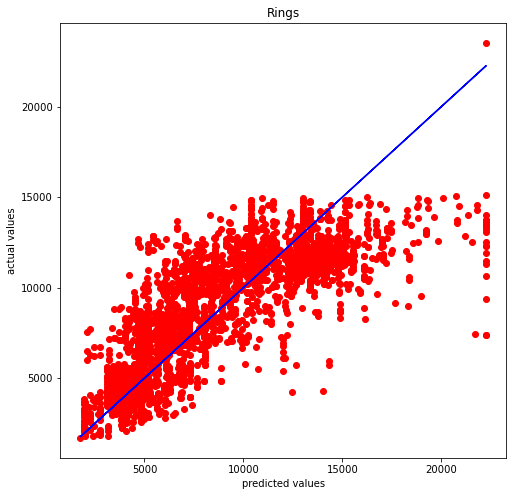

In [298]:
plt.figure(figsize=(8,8))
plt.scatter(x=y_test,y=pred_ls,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('predicted values')
plt.ylabel('actual values')
plt.title('Rings')
plt.show()

### RIDGE

In [299]:
from sklearn.model_selection import GridSearchCV
rd=Ridge()
param= {'alpha':[0.0001,0.001,0.01,0.05,0.1,0.2,0.4,0.6,0.8,1.0,2.0,5.0,10.0,100.0]}

model_cvrd=GridSearchCV(estimator=rd,param_grid=param,scoring='neg_mean_absolute_error',cv=7,return_train_score=True,verbose=1)

model_cvrd.fit(x_train,y_train)

model_cvrd.best_params_

Fitting 7 folds for each of 14 candidates, totalling 98 fits


{'alpha': 0.01}

In [300]:
rd=Ridge(alpha=0.8) #rd=ridge
rd.fit(x_train,y_train)
rd.score(x_train,y_train)
pred_rd=rd.predict(x_test)
print('The r2_score using ridge is:',r2_score(y_test,pred_rd)*100)

The r2_score using ridge is: 62.777744280079226


#### The r2_score using ridge is: 70.3266%

In [301]:
print('Error')

print('Mean absolute error',mean_absolute_error(y_test,pred_rd))
print('Mean squared error',mean_squared_error(y_test,pred_rd))


print('Root mean squared error',np.sqrt(mean_squared_error(y_test,pred_rd)))

Error
Mean absolute error 1952.2134352702828
Mean squared error 6706696.914688517
Root mean squared error 2589.729119944501


In [302]:
rd.coef_

array([[-1007.16603769, -1816.24143445,   276.51996004,  -133.85532892,
         -215.06514872,   240.64021315,   174.56923031,   -66.07661592,
        -2370.66111876,  -734.30522346, -2469.7775964 , -2199.52308013,
         1539.9634992 ,  8690.65153928,   819.56987258,  1985.90030997,
        -2525.89476182, -3243.67027374,  -459.74861037,   967.49544366,
          328.03624287,   325.79402809,   -93.87283558,   -90.42526801,
         -469.53216736,   -90.42526801,   -93.87283558,   328.03624287,
         -469.53216736,   325.79402809,  -276.37372397,  1990.43757518,
         2596.43037534,     0.        , -4310.49422656]])

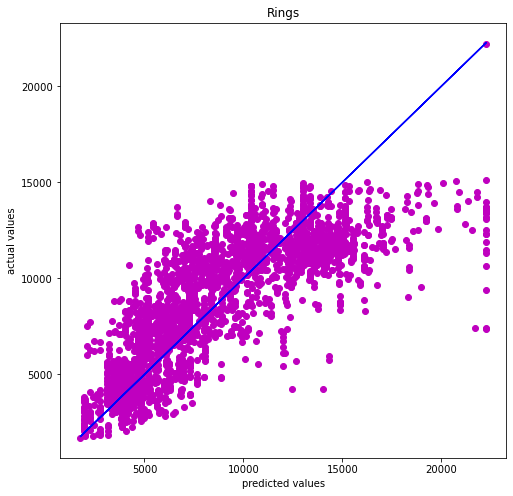

In [303]:
plt.figure(figsize=(8,8))
plt.scatter(x=y_test,y=pred_rd,color='m')
plt.plot(y_test,y_test,color='b')
plt.xlabel('predicted values')
plt.ylabel('actual values')
plt.title('Rings')
plt.show()

## Conclusion:

#### After running the the different models and applying hyper tunning we can understand that Random Forest Regressor model is the best model supporting our dataset, with R2_score of 92.47% which is best from all the models.

Even we get the least root mean squared error and mean squred error for this model (MSM: 637.1 and RMSE: 1164.5)

### TEST EXECUTION

In [304]:
y_prediction=gridrfr.predict(Flight_Test)

In [305]:
y_prediction

array([11569.70482799,  4443.22810565, 14300.79644508, ...,
       16079.69404697, 12353.00348165, 11041.38196986])

In [306]:
y_fin=pd.DataFrame({'Fare':y_prediction})

In [307]:
y_fin

,Fare
0,11569.704828
1,4443.228106
2,14300.796445
3,8829.524711
4,4507.320524
5,12063.656942
6,11871.719622
7,4999.752009
8,4820.943908
9,14762.392710


In [310]:
TEST=y_fin.round(0)

In [311]:
TEST

,Fare
0,11570.0
1,4443.0
2,14301.0
3,8830.0
4,4507.0
5,12064.0
6,11872.0
7,5000.0
8,4821.0
9,14762.0


### Above are the predicted values for test dataset.